In [2]:
%load_ext autoreload

In [3]:
%autoreload

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import os
import math
import scipy as sp
import numpy as np
import pandas as pd 
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200
import seaborn as sns 
sns.set(rc={"figure.dpi":200, 'savefig.dpi':200})
sns.set_context('notebook')
sns.set_style("ticks")
import math

sns.set_style('darkgrid')

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
import sklearn as skl
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import statsmodels.api as sm

import warnings
warnings.filterwarnings('ignore')

import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [4]:
def list_directory_tree_with_os_walk(starting_directory):
    for root, directories, files in os.walk(starting_directory):
        print(f"Directory: {root}")
        for file in files:
            print(f"  File: {file}")

list_directory_tree_with_os_walk('.')

Directory: .
  File: Cleaning.ipynb
  File: Forecasting A.ipynb
  File: Forecasting B.ipynb
  File: Forecasting C.ipynb
  File: full_arimax_A.csv
  File: full_arimax_B.csv
  File: full_arimax_C.csv
  File: full_arimax_test_213_0.csv
  File: Getting csv.ipynb
  File: Neg_Pow_Inc_0.csv
  File: Test File.ipynb
Directory: .\data
  File: Readme.md
  File: read_files.ipynb
  File: sample_submission.csv
  File: test.csv
Directory: .\data\A
  File: train_targets.parquet
  File: X_test_estimated.parquet
  File: X_train_estimated.parquet
  File: X_train_observed.parquet
Directory: .\data\B
  File: train_targets.parquet
  File: X_test_estimated.parquet
  File: X_train_estimated.parquet
  File: X_train_observed.parquet
Directory: .\data\C
  File: train_targets.parquet
  File: X_test_estimated.parquet
  File: X_train_estimated.parquet
  File: X_train_observed.parquet
Directory: .\Plots
  File: 1 pv_measurement.png
  File: absolute_humidity_2mgm3.png
  File: air_density_2mkgm3.png
  File: ceiling_he

In [5]:
train_a = pd.read_parquet('data/A/train_targets.parquet').set_index("time")
train_a = train_a[~(train_a.index < pd.Timestamp('2019-06-03 00:00:00'))]
train_a = train_a[~((train_a.index >= pd.Timestamp('2022-10-21 00:00:00')) & (train_a.index <= pd.Timestamp('2022-10-28 23:00:00')))]
train_a = train_a[~((train_a.index >= pd.Timestamp('2023-01-26 00:00:00')) & (train_a.index <= pd.Timestamp('2023-01-26 23:00:00')))]

X_train_observed_a = pd.read_parquet('data/A/X_train_observed.parquet').set_index("date_forecast")
X_train_observed_a = X_train_observed_a[~(X_train_observed_a.index < pd.Timestamp('2019-06-03 00:00:00'))]
# X_train_observed_a = X_train_observed_a[~((X_train_observed_a.index >= pd.Timestamp('2022-10-21 00:00:00')) & (X_train_observed_a.index <= pd.Timestamp('2022-10-28 23:00:00')))]
# X_train_observed_a = X_train_observed_a[~((X_train_observed_a.index >= pd.Timestamp('2023-01-26 00:00:00')) & (X_train_observed_a.index <= pd.Timestamp('2023-01-26 23:00:00')))]
X_train_observed_a = X_train_observed_a[~(X_train_observed_a.index > pd.Timestamp('2022-10-21 00:00:00'))]

X_train_estimated_a = pd.read_parquet('data/A/X_train_estimated.parquet').drop("date_calc", axis=1).set_index("date_forecast")
X_train_estimated_a = X_train_estimated_a[~(X_train_estimated_a.index < pd.Timestamp('2022-10-29 00:00:00'))]

X_test_estimated_a = pd.read_parquet('data/A/X_test_estimated.parquet').drop("date_calc", axis=1).set_index("date_forecast")


train_datetime_interval_a = train_a.index.append(pd.DatetimeIndex([train_a.index.max() + pd.Timedelta(hours=1)]).astype("datetime64[us]"))
train_datetime_interval__train_observed_a = train_datetime_interval_a[train_datetime_interval_a <= X_train_estimated_a.index.min()]
train_datetime_interval__train_estimated_a = train_datetime_interval_a[train_datetime_interval_a >= X_train_estimated_a.index.min()]


X_train_observed_a_clean_1 = pd.DataFrame(columns=X_train_observed_a.columns)
for index in range(len(train_datetime_interval__train_observed_a)-1):
    X_train_observed_a_clean_1_hour = X_train_observed_a.iloc[(X_train_observed_a.index >= train_datetime_interval__train_observed_a[index]) & (X_train_observed_a.index < train_datetime_interval__train_observed_a[index+1])]
    X_train_observed_a_clean_1 = pd.concat([X_train_observed_a_clean_1, pd.DataFrame([X_train_observed_a_clean_1_hour.mean()], columns=X_train_observed_a_clean_1.columns)], ignore_index=True)
X_train_observed_a_clean_1.index = train_datetime_interval__train_observed_a[:len(X_train_observed_a_clean_1)]
X_train_observed_a_clean_1.index.name = "time"

X_train_estimated_a_clean_1 = pd.DataFrame(columns=X_train_estimated_a.columns)
for index in range(len(train_datetime_interval__train_estimated_a)-1):
    X_train_estimated_a_clean_1_hour = X_train_estimated_a.iloc[(X_train_estimated_a.index >= train_datetime_interval__train_estimated_a[index]) & (X_train_estimated_a.index < train_datetime_interval__train_estimated_a[index+1])]
    X_train_estimated_a_clean_1 = pd.concat([X_train_estimated_a_clean_1, pd.DataFrame([X_train_estimated_a_clean_1_hour.mean()], columns=X_train_estimated_a_clean_1.columns)], ignore_index=True)
X_train_estimated_a_clean_1.index = train_datetime_interval__train_estimated_a[:len(X_train_estimated_a_clean_1)]
X_train_estimated_a_clean_1.index.name = "time"

X_train_a_clean_1 = pd.concat([X_train_observed_a_clean_1, X_train_estimated_a_clean_1])

X_train_a_clean_2 = X_train_a_clean_1.drop(X_train_a_clean_1.columns[[2,5,30]], axis=1)



In [6]:
len(X_train_a_clean_2)

34056

In [38]:
# seasonal_model_test_full_0 = SARIMAX(endog = train_a, exog = X_train_a_clean_2, order = (1, 0, 1), seasonal_order=(1, 0, 1, 24))
seasonal_model_test_full_0 = SARIMAX(endog = train_a, order = (2, 0, 1), seasonal_order=(1, 0, 1, 365))

In [39]:
seasonal_model_test_full_0_fit = seasonal_model_test_full_0.fit()

In [40]:
seasonal_model_test_full_0_fit.aic

500719.9176773453

In [31]:
seasonal_model_test_full_0_fit.aic

501047.9352287589

In [45]:
best_params = auto_arima(y = train_a,
                        #  X = X_train_a_clean_2,
                         start_p = 0,
                         d = 0,
                         start_q = 0,
                         max_p = 10,
                         max_d = 10,
                         max_q = 10,
                         start_P = 0,
                         D = 0,
                         start_Q = 0,
                         max_P = 10,
                         max_D = 10,
                         max_Q = 10,
                         m = 24,
                         information_criterion = "aic",
                         trace=True,
                         suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[24] intercept   : AIC=577626.920, Time=0.20 sec
 ARIMA(1,0,0)(1,0,0)[24] intercept   : AIC=508650.761, Time=33.05 sec
 ARIMA(0,0,1)(0,0,1)[24] intercept   : AIC=535577.672, Time=35.26 sec
 ARIMA(0,0,0)(0,0,0)[24]             : AIC=586371.701, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[24] intercept   : AIC=513219.527, Time=0.53 sec
 ARIMA(1,0,0)(2,0,0)[24] intercept   : AIC=506120.847, Time=206.88 sec
 ARIMA(1,0,0)(3,0,0)[24] intercept   : AIC=inf, Time=1391.25 sec
 ARIMA(1,0,0)(2,0,1)[24] intercept   : AIC=inf, Time=561.99 sec


KeyboardInterrupt: 

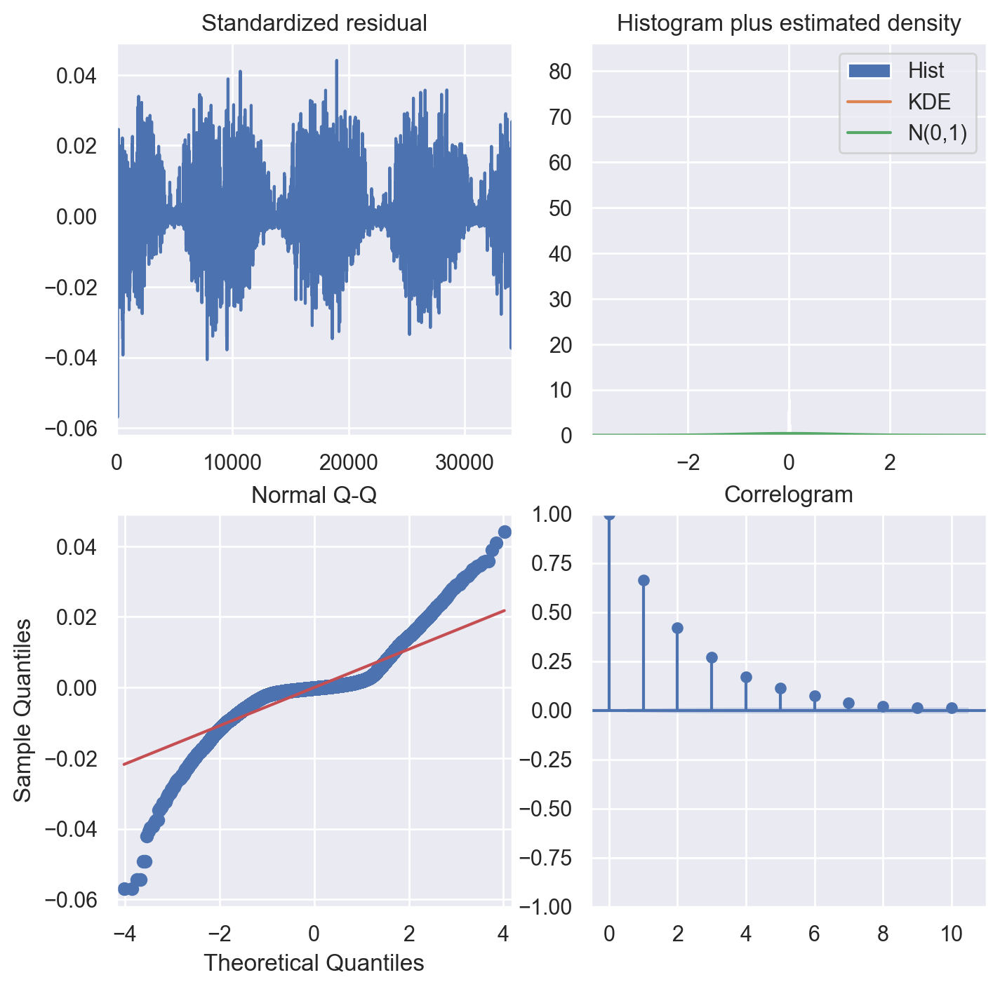

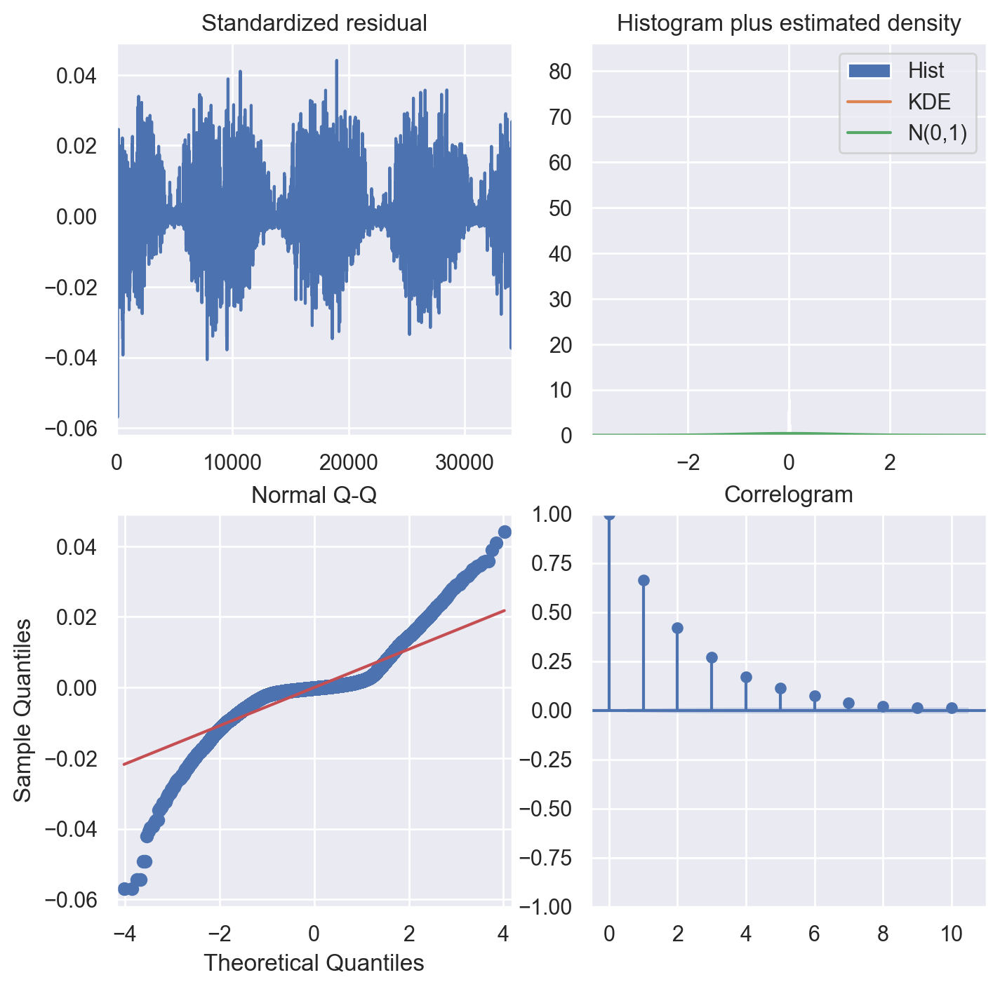

In [92]:
best_params.plot_diagnostics(figsize=(8,8))

In [ ]:
best_params.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                34061
Model:                        SARIMAX   Log Likelihood             -418907.875
Date:                Wed, 27 Sep 2023   AIC                         837901.750
Time:                        18:28:35   BIC                         838264.494
Sample:                             0   HQIC                        838017.442
                              - 34061                                         
Covariance Type:                  opg                                         
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
absolute_humidity_2m:gm3         -73.6225   9.83e+04     -0.001      0.999   -1.93e+05    1.93e+05
air_density_2m:kgm3            -8378.8408   7824.060     -1.071      0.284   -2.37e+04    6956.034
clear_sky_energy_1h:J             -0.0001      1.910  -7.44e-05      1.000      -3.745       3.744
clear_sky_rad:W                    1.6202   7232.622      0.000      1.000   -1.42e+04    1.42e+04
dew_or_rime:idx                   53.3869   4.27e+04      0.001      0.999   -8.36e+04    8.37e+04
dew_point_2m:K                    34.0434   1.49e+05      0.000      1.000   -2.91e+05    2.91e+05
diffuse_rad:W                      5.3294   9233.940      0.001      1.000   -1.81e+04    1.81e+04
diffuse_rad_1h:J                  -0.0007      2.665     -0.000      1.000      -5.223       5.222
direct_rad:W                       7.4443   3741.468      0.002      0.998   -7325.698    7340.587
direct_rad_1h:J                   -0.0005      1.062     -0.000      1.000      -2.082       2.081
effective_cloud_cover:p           -1.7836   1.02e+04     -0.000      1.000      -2e+04       2e+04
elevation:m                     -199.3658   3.49e+04     -0.006      0.995   -6.87e+04    6.83e+04
fresh_snow_12h:cm                 -4.6857   4.33e+05  -1.08e-05      1.000   -8.48e+05    8.48e+05
fresh_snow_1h:cm                 104.6577   9.23e+04      0.001      0.999   -1.81e+05    1.81e+05
fresh_snow_24h:cm                 -9.9075   2.64e+05  -3.76e-05      1.000   -5.16e+05    5.16e+05
fresh_snow_3h:cm                  13.3920   3.13e+05   4.28e-05      1.000   -6.13e+05    6.13e+05
fresh_snow_6h:cm                  -2.2196   7.68e+05  -2.89e-06      1.000   -1.51e+06    1.51e+06
is_day:idx                       -35.9959    5.4e+05  -6.66e-05      1.000   -1.06e+06    1.06e+06
is_in_shadow:idx                 -37.6585   6.09e+05  -6.18e-05      1.000   -1.19e+06    1.19e+06
msl_pressure:hPa                 319.6181   9.36e+04      0.003      0.997   -1.83e+05    1.84e+05
precip_5min:mm                  -276.9836   3.93e+04     -0.007      0.994   -7.72e+04    7.67e+04
precip_type_5min:idx             -69.9529   4.37e+05     -0.000      1.000   -8.57e+05    8.57e+05
pressure_100m:hPa               -588.7551   7.03e+04     -0.008      0.993   -1.38e+05    1.37e+05
pressure_50m:hPa                -128.9964    3.3e+04     -0.004      0.997   -6.48e+04    6.45e+04
prob_rime:p                        1.0654   1.73e+05   6.14e-06      1.000    -3.4e+05     3.4e+05
rain_water:kgm2                   94.9762   1.11e+05      0.001      0.999   -2.17e+05    2.17e+05
relative_humidity_1000hPa:p       -1.9438   2.58e+04  -7.54e-05      1.000   -5.05e+04    5.05e+04
sfc_pressure:hPa                 399.9816   2.11e+04      0.019      0.985    -4.1e+04    4.18e+04
snow_depth:cm                     -2.1190   4.04e+05  -5.24e-06      1.000   -7.92e+05    7.92e+05
snow_drift:idx                  1.983e-11   3.65e-17   5.43e+05      0.00

In [57]:
test = X_train_a_clean_2
for i in range(len(test.columns)):
    se = len(test[test.iloc[:,[i]].isna().any(axis=1)])
    if se != 0:
        print(se, test.columns[i], i)

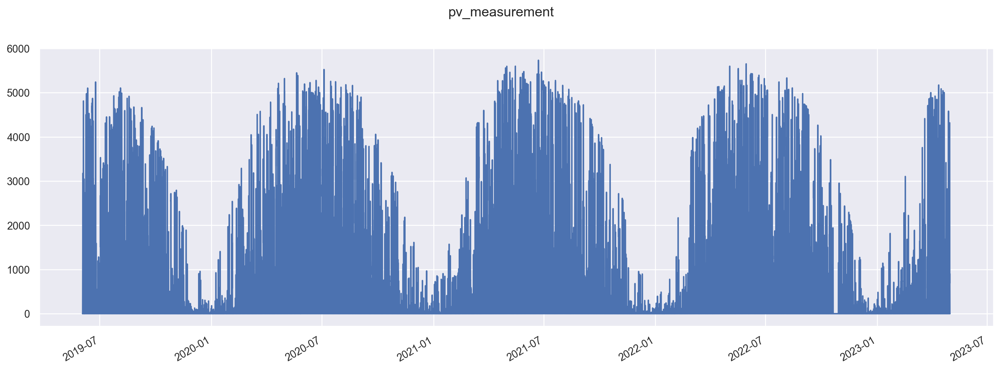

In [59]:
f, ax = plt.subplots(figsize=(18,6),dpi=200);
plt.plot(train_a.index, train_a)
plt.gcf().autofmt_xdate()
plt.suptitle(train_a.columns[0])
plt.show()

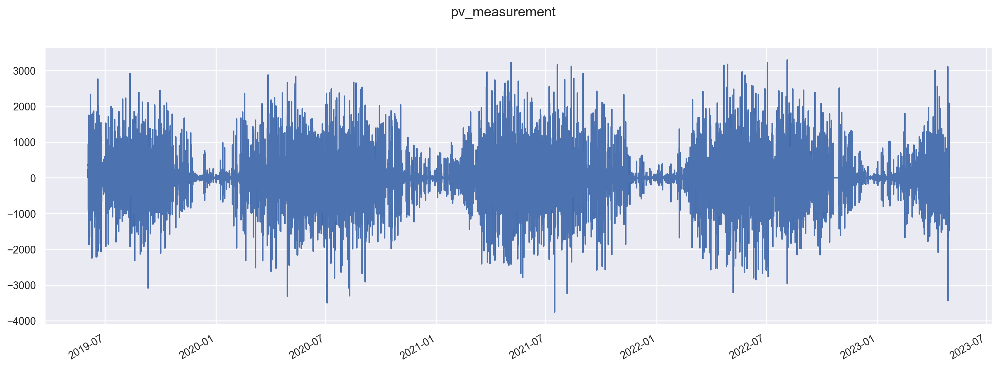

In [72]:
f, ax = plt.subplots(figsize=(18,6),dpi=200);
plt.plot(train_a.index[1:], (train_a - train_a.shift(1)).dropna())
plt.gcf().autofmt_xdate()
plt.suptitle(train_a.columns[0])
plt.show()

In [56]:
pd.Series(kpss(train_a, regression="c", nlags="auto")[0:3], index=["Test Statistic", "p-value", "Lags Used"])

Test Statistic     1.056693
p-value            0.010000
Lags Used         51.000000
dtype: float64

In [50]:
pd.Series(adfuller(train_a)[0:4], index=["Test Statistic","p-value","#Lags Used","Number of Observations Used",])

Test Statistic                -9.879893e+00
p-value                        3.794623e-17
#Lags Used                     5.200000e+01
Number of Observations Used    3.400800e+04
dtype: float64

In [55]:
pd.Series(kpss((train_a - train_a.shift(1)).dropna(), regression="c", nlags="auto")[0:3], index=["Test Statistic", "p-value", "Lags Used"])

Test Statistic      0.016495
p-value             0.100000
Lags Used         336.000000
dtype: float64

In [53]:
pd.Series(adfuller((train_a - train_a.shift(3)).dropna())[0:4], index=["Test Statistic","p-value","#Lags Used","Number of Observations Used",])

Test Statistic                   -37.395116
p-value                            0.000000
#Lags Used                        52.000000
Number of Observations Used    34005.000000
dtype: float64

In [ ]:
for i in range(10):
    for j in range(10):
        for k in range(10):
            print(i, j, k, SARIMAX(train_a["pv_measurement"], order = (i, j, k)).fit().aic)

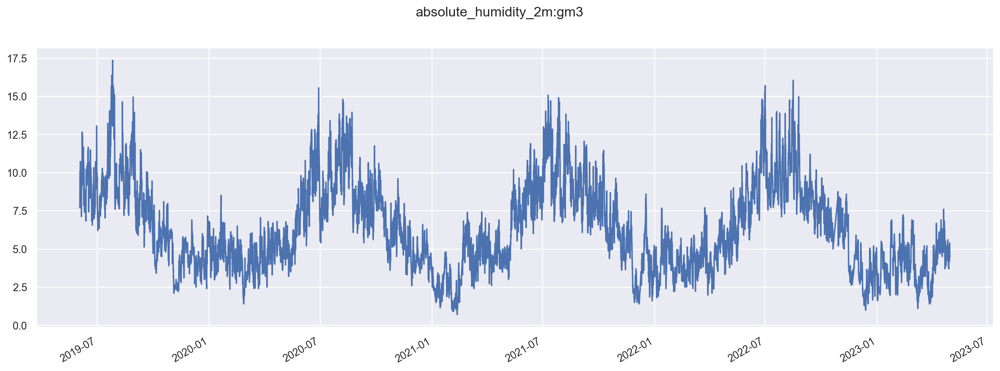

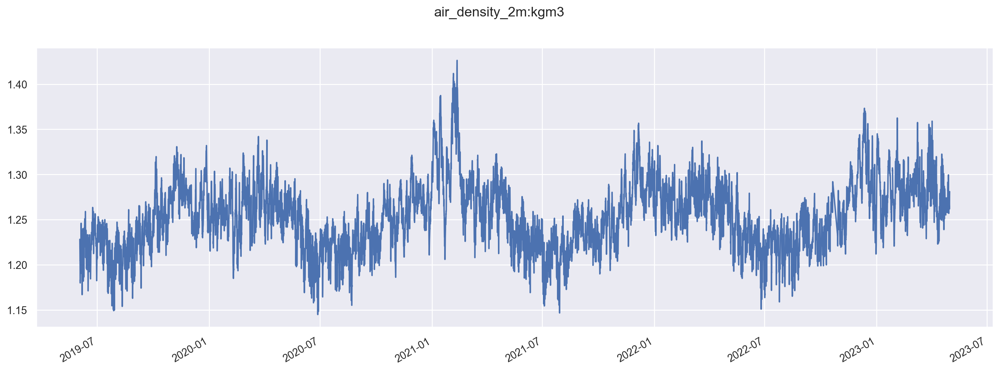

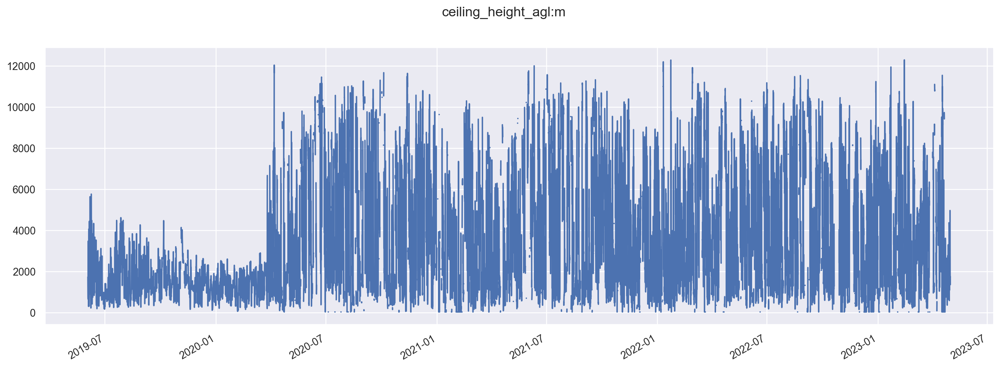

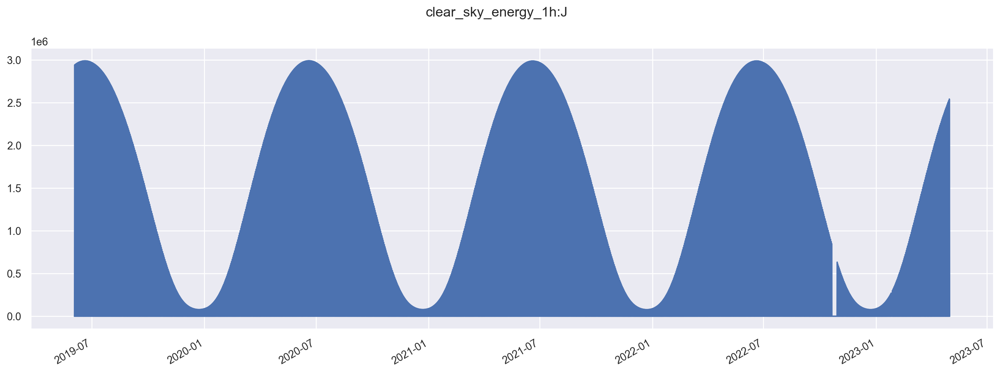

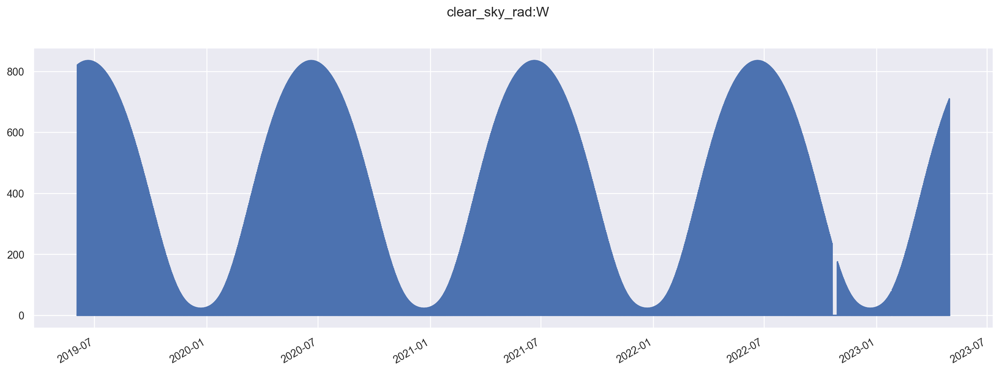

...

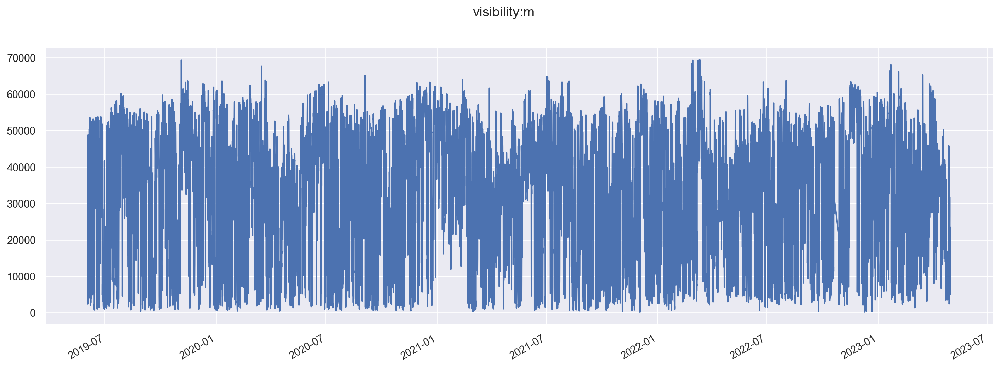

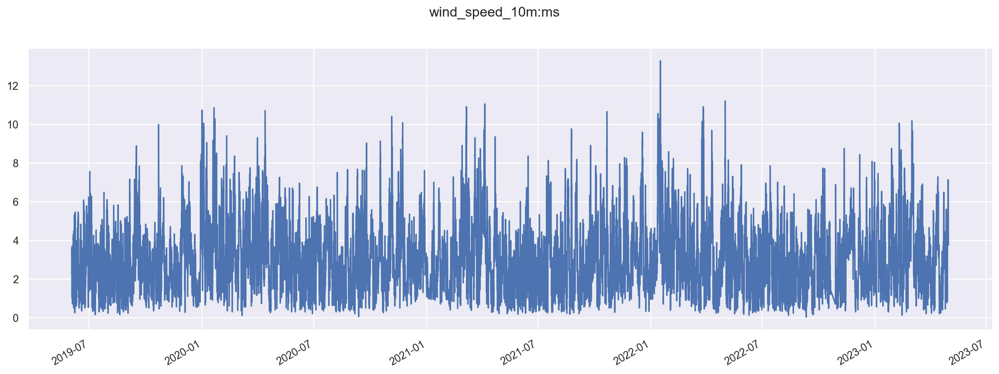

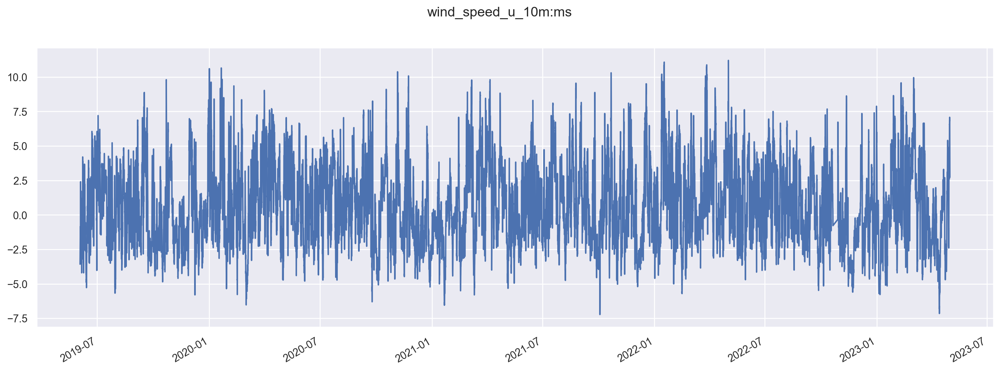

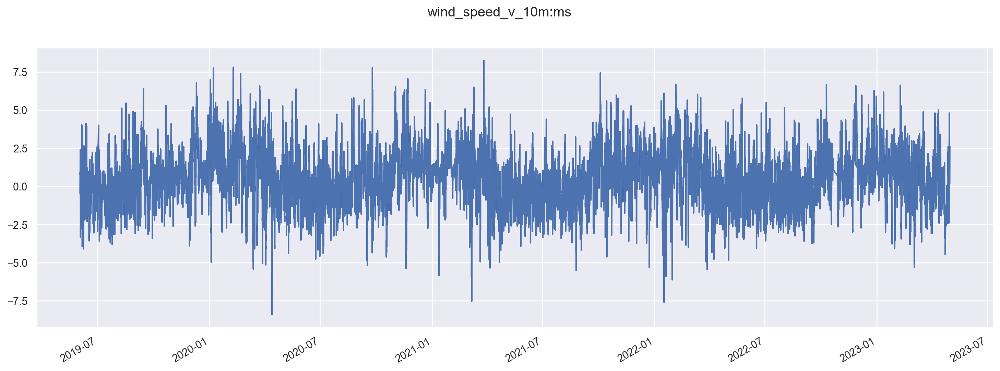

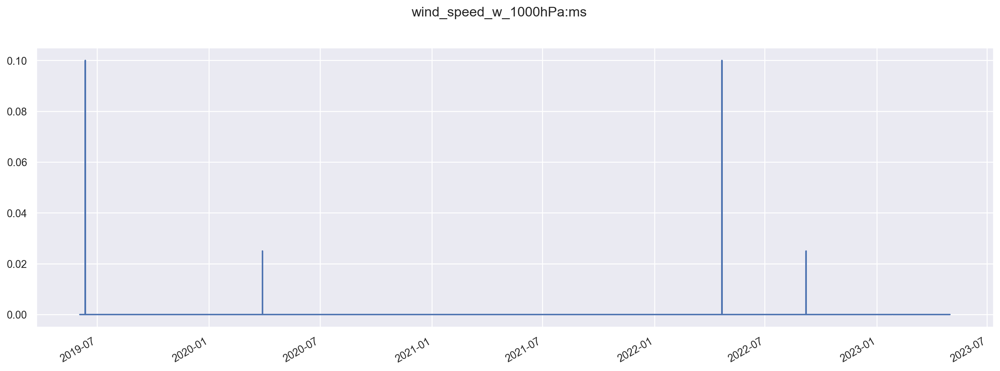

In [9]:
for i in range(len(X_train_a_clean_1.columns)):
    f, ax = plt.subplots(figsize=(18,6),dpi=200);
    plt.plot(X_train_a_clean_1.index, X_train_a_clean_1[X_train_a_clean_1.columns[i]])
    plt.gcf().autofmt_xdate()
    plt.suptitle(X_train_a_clean_1.columns[i])
    navn = X_train_a_clean_1.columns[i].replace(":","")
    plt.savefig(f"{navn}.png")
    # plt.show()

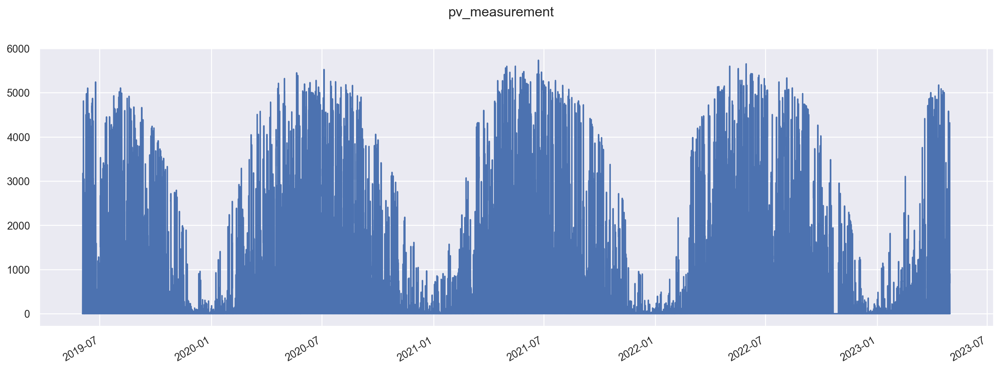

In [39]:
f, ax = plt.subplots(figsize=(18,6),dpi=200);
plt.plot(train_a.index, train_a)
plt.gcf().autofmt_xdate()
plt.suptitle(train_a.columns[0])
plt.savefig(f"{train_a.columns[0]}.png")
plt.show()

In [99]:
# datelist = pd.date_range(train_a.index.min(), train_a.index.max(), freq='H').tolist()
# idx_list = train_a.index.to_list()
# idx_list == datelist

In [103]:
datelist = pd.date_range(train_a.index.min(), train_a.index.max(), freq='H', unit = "us")
idx_list = train_a.index

In [109]:
len(datelist), len(idx_list), len(set(idx_list))

(34274, 34085, 34085)

In [107]:
dt_idc = pd.to_datetime(train_a.index, format='%Y-%m-%d %H:%M:%S')

In [108]:
#troubleshooting indices by inspecting irregularities of order. Header is printed first
print('Index,   current datetime,   current value,   last datetime,   last value,   timedelta,   value delta')

#collecting important values of irregular indices (index value and timedelta) for later use
idc = []

#iterating through datetime indices
for idx in range(1,len(dt_idc)):
    
    #if statement is True, if difference between consecutive datetime indices is not one hour
    if dt_idc[idx] - dt_idc[idx-1] != datetime.timedelta(hours=1):
        
        #appending collection of important values
        idc.append([idx,dt_idc[idx] - dt_idc[idx-1]])
        
        #printing values according to header
        print('{},   {},   {},   {},   {},   {},   {}'.format(idx, dt_idc[idx], train_a.iloc[idx,0], dt_idc[idx-1], train_a.iloc[idx-1,0], dt_idc[idx]-dt_idc[idx-1], train_a.iloc[idx,0]-train_a.iloc[idx-1,0]))

Index,   current datetime,   current value,   last datetime,   last value,   timedelta,   value delta
29667,   2022-10-28 22:00:00,   0.0,   2022-10-21 00:00:00,   0.0,   7 days 22:00:00,   0.0


In [129]:
datelist[~((datelist < "2022-10-28 22:00:00") & (datelist > "2022-10-21 00:00:00"))]

DatetimeIndex(['2019-06-02 22:00:00', '2019-06-02 23:00:00',
               '2019-06-03 00:00:00', '2019-06-03 01:00:00',
               '2019-06-03 02:00:00', '2019-06-03 03:00:00',
               '2019-06-03 04:00:00', '2019-06-03 05:00:00',
               '2019-06-03 06:00:00', '2019-06-03 07:00:00',
               ...
               '2023-04-30 14:00:00', '2023-04-30 15:00:00',
               '2023-04-30 16:00:00', '2023-04-30 17:00:00',
               '2023-04-30 18:00:00', '2023-04-30 19:00:00',
               '2023-04-30 20:00:00', '2023-04-30 21:00:00',
               '2023-04-30 22:00:00', '2023-04-30 23:00:00'],
              dtype='datetime64[us]', length=34085, freq=None)

In [128]:
idx_list

DatetimeIndex(['2019-06-02 22:00:00', '2019-06-02 23:00:00',
               '2019-06-03 00:00:00', '2019-06-03 01:00:00',
               '2019-06-03 02:00:00', '2019-06-03 03:00:00',
               '2019-06-03 04:00:00', '2019-06-03 05:00:00',
               '2019-06-03 06:00:00', '2019-06-03 07:00:00',
               ...
               '2023-04-30 14:00:00', '2023-04-30 15:00:00',
               '2023-04-30 16:00:00', '2023-04-30 17:00:00',
               '2023-04-30 18:00:00', '2023-04-30 19:00:00',
               '2023-04-30 20:00:00', '2023-04-30 21:00:00',
               '2023-04-30 22:00:00', '2023-04-30 23:00:00'],
              dtype='datetime64[us]', name='time', length=34085, freq=None)